<a href="https://colab.research.google.com/github/Sirmj-1986/Sample-Angle-Mapper-Code/blob/main/Copy_of_Hydrothermal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import ee
import geemap

In [ ]:
ee.Authenticate()

In [ ]:
ee.Initialize(
    project = 'ee-mjfati0086')

*** Earth Engine *** Share your feedback by taking our Annual Developer Satisfaction Survey: https://google.qualtrics.com/jfe/form/SV_7TDKVSyKvBdmMqW?ref=4i2o6


In [ ]:
kogi = ee.Geometry.Polygon([
    [6.384633300164806, 8.00523783856405],
    [6.384633300164806, 7.918874512340253],
    [6.588567015985118, 7.918874512340253],
    [6.588567015985118, 8.00523783856405]
])


In [ ]:
center_lat = (8.00523783856405 + 7.918874512340253) / 2.0
center_lon = (6.384633300164806 + 6.588567015985118) / 2.0
Map = geemap.Map(center=(center_lat, center_lon), zoom=12)

In [ ]:
Map.addLayer(kogi, {}, 'ROI')
Map.centerObject(kogi, 13)

Map

Map(bottom=1002306.0, center=[7.962067105113433, 6.486600158075314], controls=(WidgetControl(options=['positio…

<IPython.core.display.Javascript object>

vis_params = {'bands': ['B04', 'B06', 'B09'], 'gamma': 1.0, 'min': 0.0, 'max': 100.0}


In [ ]:
aster_col = (
    ee.ImageCollection("ASTER/AST_L1T_003")
    .filterBounds(kogi)
    .filter(ee.Filter.lt('CLOUDCOVER', 0.1))
    .filter(ee.Filter.calendarRange(11, 3, 'month'))
)

asterRaw = aster_col.median().clip(kogi)

asterBandNames = ['B01','B02','B3N','B04','B05','B06','B07','B08','B09']
asterBands = asterRaw.select(asterBandNames)

In [ ]:
Map.addLayer(asterRaw, {}, 'Raw ASTER', shown=False)
Map

Map(bottom=1002344.0, center=[7.962067105113433, 6.486600158075314], controls=(WidgetControl(options=['positio…

<IPython.core.display.Javascript object>

vis_params = {'bands': ['B04', 'B3N', 'B02'], 'gamma': 1.0, 'min': 0.0, 'max': 100.0}


In [ ]:
# Dark Object Subtraction (DOS)
def apply_dos(image, band_names, geometry, scale=30):
    """
    image: ee.Image
    band_names: list of band names (strings)
    geometry: ee.Geometry for statistics
    """
    corrected_bands = []
    for b in band_names:
        band = image.select(b)

        dark_val = band.reduceRegion(
            reducer=ee.Reducer.percentile([1]),
            geometry=geometry,
            scale=scale,
            maxPixels=1e9
        ).get(b)
        dark_num = ee.Number(dark_val)
        corrected = band.subtract(dark_num).rename(b)

        corrected_bands.append(corrected.max(0))
    return ee.Image.cat(corrected_bands)

asterDOS = apply_dos(asterRaw, asterBandNames, kogi, scale=30).clip(kogi)
Map.addLayer(asterDOS, {}, 'ASTER DOS Corrected', shown=False)
Map


Map(bottom=1002306.0, center=[7.968457645529404, 6.488199234008789], controls=(WidgetControl(options=['positio…

In [ ]:
# SAM function and apply to references
references = {
    "Calcite":    [0.19, 0.22, 0.23, 0.28, 0.32, 0.31, 0.29, 0.26, 0.22],
    "Kaolinite":  [0.12, 0.14, 0.16, 0.20, 0.24, 0.23, 0.22, 0.20, 0.18],
    "IronOxide":  [0.42, 0.45, 0.46, 0.38, 0.32, 0.28, 0.25, 0.23, 0.20],
}

def spectral_angle(image, reference_spectrum, bands):
    """
    Compute spectral angle (in degrees) between image pixel spectra and reference_spectrum.
      - image: ee.Image with bands selected in order 'bands'
      - reference_spectrum: python list of spectral values (same length as bands)
      - bands: list of band names (strings) in the same order
    """
    ref = ee.Image.constant(reference_spectrum).toArray()
    img = image.select(bands).toArray()
    dot = img.multiply(ref).arrayReduce(ee.Reducer.sum(), [0])
    norm_i = img.multiply(img).arrayReduce(ee.Reducer.sum(), [0]).sqrt()
    norm_r = ref.multiply(ref).arrayReduce(ee.Reducer.sum(), [0]).sqrt()
    cos_sim = dot.divide(norm_i.multiply(norm_r))

    cos_sim = cos_sim.max(-1).min(1)
    angle = cos_sim.acos().multiply(180 / 3.141592653589793)
    return angle.arrayProject([0]).arrayFlatten([['angle']])

sam_colors = {"Calcite":"red", "Kaolinite":"blue", "IronOxide":"gold"}

sam_images = []
for mineral, spec in references.items():
    angle = spectral_angle(asterDOS, spec, asterBandNames).rename(mineral + '_SAM')
    sam_images.append(angle)

    Map.addLayer(
        angle,
        {"min": 0, "max": 45, "palette": ['purple','white','orange','green','blue','red']},
        mineral + ' SAM Angle',
        shown=False
    )

    mask = angle.lt(8).selfMask().rename(mineral + '_Mask')
    Map.addLayer(mask, {"palette":[sam_colors[mineral]]}, mineral + ' SAM (Masked)', shown=False)


sam_image = ee.Image.cat(sam_images)
Map


Map(bottom=1002306.0, center=[7.968457645529404, 6.488199234008789], controls=(WidgetControl(options=['positio…

<IPython.core.display.Javascript object>

vis_params = {'bands': ['B04', 'B06', 'B09'], 'gamma': 1.0, 'min': 0.0, 'max': 100.0}


In [ ]:
#PCA: means, covariance, eigen-decomp, projection
bands = ['B01','B02','B3N','B04','B05','B06','B07','B08','B09']
image = asterDOS.select(bands).clip(kogi)  # DOS-corrected image

print("Band names:", image.bandNames().getInfo())

mean_dict = image.reduceRegion(
    reducer=ee.Reducer.mean(),
    geometry=kogi,
    scale=30,
    maxPixels=1e13
)

band_names = ee.List(bands)
mean_list = band_names.map(lambda b: mean_dict.get(b))
mean_image = ee.Image.constant(mean_list).rename(band_names)

normalized = image.subtract(mean_image)

#Covariance matrix --
array_image = normalized.toArray()
covar_dict = array_image.reduceRegion(
    reducer=ee.Reducer.covariance(),
    geometry=kogi,
    scale=30,
    maxPixels=1e13
)

covar_array = ee.Array(covar_dict.get('array'))
print("Covariance matrix (server-side ee.Array). To view client-side, run covar_array.getInfo() below if desired.")


# Eigen decomposition --
eigens = covar_array.eigen()
eigenValues = eigens.slice(1, 0, 1)
eigenVectors = eigens.slice(1, 1)

flat_array = image.toArray().toArray(1)

projected = ee.Image(eigenVectors).matrixMultiply(flat_array)

pc_names = ['PC{}'.format(i) for i in range(1, len(bands)+1)]
pc_image = (projected
            .arrayProject([0])
            .arrayFlatten([pc_names]))

Map.addLayer(pc_image.select('PC1'), {'min': -0.5, 'max': 0.5, 'palette': ['blue','green','red']}, 'ASTER PCA - PC1', shown=False)
Map.addLayer(pc_image.select('PC2'), {'min': -0.5, 'max': 0.5, 'palette': ['blue','green','red']}, 'ASTER PCA - PC2', shown=False)
Map.addLayer(pc_image.select('PC3'), {'min': -0.5, 'max': 0.5, 'palette': ['blue','green','red']}, 'ASTER PCA - PC3', shown=False)
Map.addLayer(pc_image.select(['PC2','PC3','PC5']), {'min': -2, 'max': 2}, 'PCA RGB (PC2-PC3-PC5)', shown=False)

Map


Band names: ['B01', 'B02', 'B3N', 'B04', 'B05', 'B06', 'B07', 'B08', 'B09']
Covariance matrix (server-side ee.Array). To view client-side, run covar_array.getInfo() below if desired.


Map(bottom=1002323.0, center=[7.965567568913669, 6.487855911254884], controls=(WidgetControl(options=['positio…

**MACHINE AND DEEP LEARNING CODE**

In [ ]:
!pip install rasterio
!pip install earthpy

In [ ]:
import pandas as pd
import numpy as np
import rasterio
import earthpy.plot as ep
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
from matplotlib.colors import from_levels_and_colors
import seaborn as sns
import os

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
Sample_Path = '/content/drive/MyDrive/GEE_Exports/Training_Samples_Fixed.csv'
Image_Path = '/content/drive/MyDrive/GEE_Exports/ImageG_Stacked_Float.tif'

In [ ]:
Bands = ['PC2', 'PC3', 'PC5', 'geology','B09', 'B08', 'B07', 'B05', 'B06', 'B3N',
  'Calcite_SAM', 'Kaolinite_SAM', 'IronOxide_SAM']
LC = ['class']
Classes = [0, 1, 2, 3]
N_Classes = 4
Names = ["No_Alteration", "Calcite", "Kaolinite", "IronOxide"]
Palette = [
    '#008000',  # Green  for class 0 (No_Alteration)
    '#FF0000',  # Red    for class 1 (Calcite)
    '#0000FF',  # Blue   for class 2 (Kaolinite)
    '#FFD700',  # Gold   for class 3 (IronOxide)
]

Image has 13 bands.
Image dimensions: 321 rows x 757 columns
Coordinate Reference System (CRS): EPSG:4326


<Figure size 800x800 with 0 Axes>

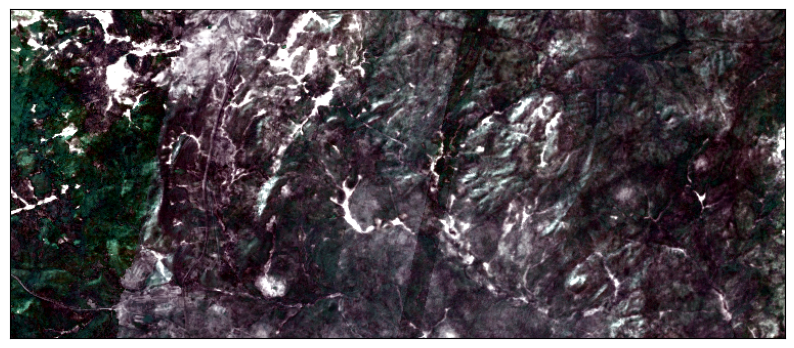

In [ ]:
image = rasterio.open(Image_Path)

band_count = image.count
height = image.height
width = image.width
crs = image.crs
transform = image.transform

print(f"Image has {band_count} bands.")
print(f"Image dimensions: {height} rows x {width} columns")
print(f"Coordinate Reference System (CRS): {crs}")

band_indices_for_vis = [Bands.index('Calcite_SAM') + 1, Bands.index('Kaolinite_SAM') + 1, Bands.index('IronOxide_SAM') + 1]

image_vis = []
for b_index in band_indices_for_vis:
    image_vis.append(image.read(b_index))
image_vis = np.stack(image_vis)

plt.figure(figsize=(8,8))
ep.plot_rgb(
    image_vis,
    stretch=True
)
plt.show()

In [ ]:
df = pd.read_csv(Sample_Path)
print(df.head())

X = df[Bands]
y = df['class']

print(f"Missing values in features: {X.isnull().sum().sum()}")
print(f"Missing values in label: {y.isnull().sum()}")

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

print(f"Training samples: {X_train.shape[0]}")
print(f"Testing samples: {X_test.shape[0]}")


  system:index   B05   B06        B07        B08        B09  B3N  Calcite_SAM  \
0    1_1_1_0_0   7.0   9.5  10.220835  10.229438   8.223329  4.5    18.902552   
1    1_1_1_1_0   3.0   2.0   0.220835   2.229438   0.723329  8.0    48.737519   
2    1_1_1_2_0  15.0  18.5  18.220835  18.729438  13.723329  4.0    14.232379   
3    1_1_1_3_0   2.0   3.0   3.220835   3.229438   2.223329  4.0    29.433654   
4    1_1_1_4_0  13.0  15.5  15.220835  16.229438  11.723329  5.0    16.650979   

   IronOxide_SAM  Kaolinite_SAM        PC2       PC3       PC5  class  \
0      20.040889      24.755917  10.306033 -3.073469  3.667933      0   
1      41.608680      41.136767  -2.688805 -6.491644  0.926022      0   
2      15.668853      19.731499  13.640194  0.081425  3.723284      0   
3      23.477301      28.250108   1.957668 -2.268212  2.162830      0   
4      18.921287      23.501282  15.892964 -3.004698  4.345870      0   

   geology                                               .geo  
0      363

/tmp/ipython-input-2604818493.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


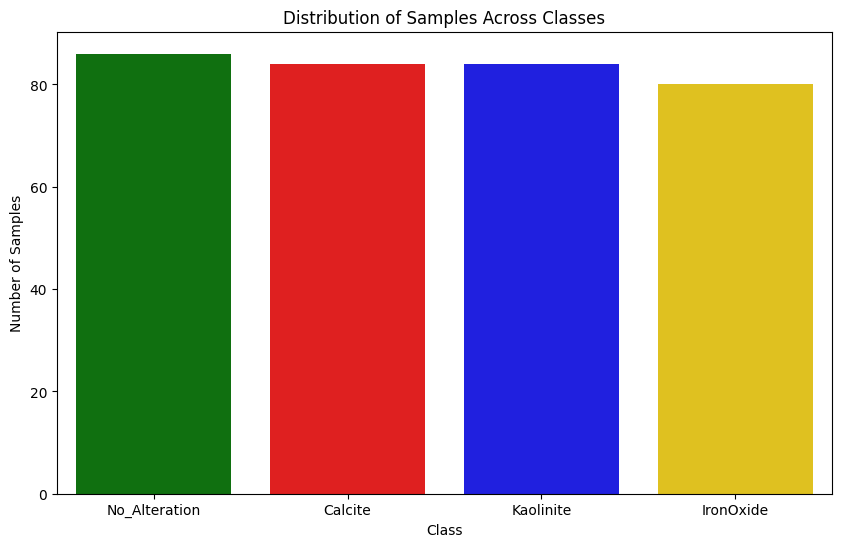

In [ ]:
df_train = X_train.copy()
df_train['class'] = y_train.values

plt.figure(figsize=(10, 6))

sns.countplot(
    x='class',
    data=df_train,
    palette=Palette
)
plt.title('Distribution of Samples Across Classes')
plt.xlabel('Class')
plt.ylabel('Number of Samples')
plt.xticks(
    ticks=[0, 1, 2, 3],
    labels=["No_Alteration", "Calcite", "Kaolinite", "IronOxide"]
)
plt.show()

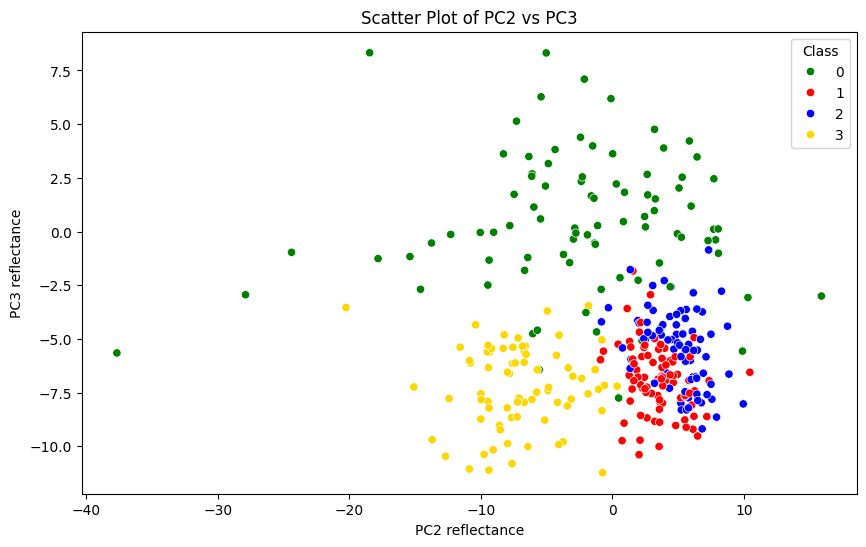

In [ ]:
df_train = X_train.copy()
df_train['class'] = y_train.values

plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='PC2',
    y='PC3',
    hue='class',
    data=df_train,
    palette=Palette
)
plt.title('Scatter Plot of PC2 vs PC3')
plt.xlabel('PC2 reflectance')
plt.ylabel('PC3 reflectance')
plt.legend(title='Class')
plt.show()

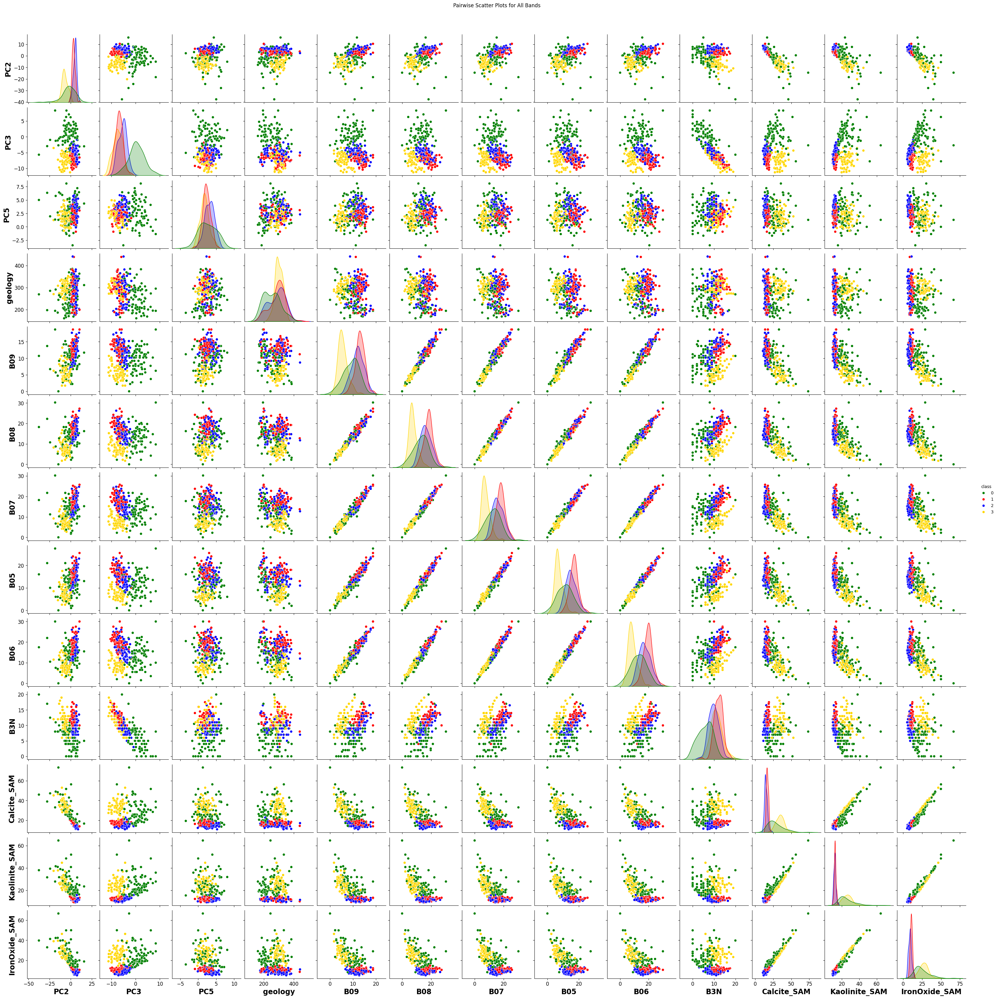

In [ ]:
g = sns.pairplot(df_train, vars=Bands, hue='class', palette=Palette)
g.fig.suptitle('Pairwise Scatter Plots for All Bands', y=1.02)

for ax in g.axes.flat:
    ax.set_xlabel(ax.get_xlabel(), fontsize=17, fontweight='bold')
    ax.set_ylabel(ax.get_ylabel(), fontsize=17, fontweight='bold')
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)

plt.show()

In [ ]:
export_folder = '/content/drive/MyDrive/AGU'
export_filename = 'Pairwise_Scatter_Plot222.png'
export_path = os.path.join(export_folder, export_filename)

if not os.path.exists(export_folder):
    os.makedirs(export_folder)
g.savefig(export_path, dpi=1000, bbox_inches='tight')

print(f"Pair plot exported successfully to: {export_path}")

Pair plot exported successfully to: /content/drive/MyDrive/AGU/Pairwise_Scatter_Plot222.png


In [ ]:
# Import TSNE
from sklearn.manifold import TSNE

# 1. Initialize the t-SNE model
tsne = TSNE(
    n_components=2,  # Project down to 2D
    perplexity=30,   # Typical range is 5-50; tune as needed
    random_state=42, # For reproducibility
    n_iter=1000      # Number of gradient descent iterations
)

# 2. Fit and transform your feature matrix
X_tsne = tsne.fit_transform(X)

# 3. Plot the results
plt.figure(figsize=(10, 8))

color_map = {class_label: Palette[i] for i, class_label in enumerate(Classes)}
colors = [color_map[label] for label in y]



/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


<Figure size 1000x800 with 0 Axes>

In [ ]:
# Define hyperparameter grid for Random Forest
param_grid_rf = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10]
}
param_grid_svm = {
    'C': [0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto']
}
param_grid_xgb = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7]
}
print("Hyperparameter grids defined.")

Hyperparameter grids defined.


In [ ]:
# Random Forest Grid Search
rf_grid_search = GridSearchCV(
    RandomForestClassifier(random_state=42),
    param_grid_rf,
    cv=5
)
rf_grid_search.fit(X_train, y_train)

# SVM Grid Search
svm_grid_search = GridSearchCV(
    SVC(random_state=42, probability=True),
    param_grid_svm,
    cv=5
)
svm_grid_search.fit(X_train, y_train)

# XGBoost Grid Search
from xgboost import XGBClassifier

xgb_grid_search = GridSearchCV(
    XGBClassifier(
        objective='multi:softmax',
        num_class=N_Classes,
        eval_metric='mlogloss',
        random_state=42
    ),
    param_grid_xgb,
    cv=5
)
xgb_grid_search.fit(X_train, y_train)

print("Grid search for all models complete.")

Grid search for all models complete.



** Random Forest **
Accuracy: 0.8194444444444444
              precision    recall  f1-score   support

           0       0.94      0.87      0.90        38
           1       0.74      0.78      0.76        36
           2       0.72      0.72      0.72        36
           3       0.89      0.91      0.90        34

    accuracy                           0.82       144
   macro avg       0.82      0.82      0.82       144
weighted avg       0.82      0.82      0.82       144



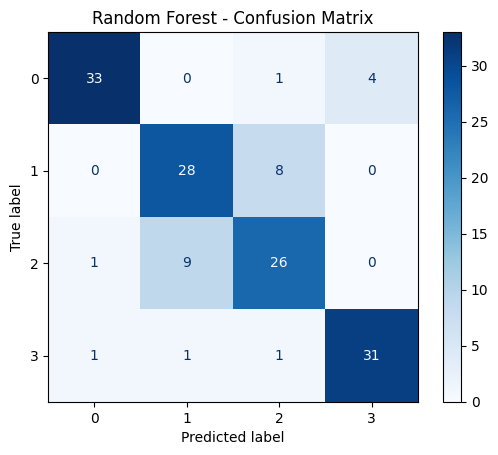


** SVM **
Accuracy: 0.7777777777777778
              precision    recall  f1-score   support

           0       0.89      0.82      0.85        38
           1       0.66      0.69      0.68        36
           2       0.71      0.67      0.69        36
           3       0.86      0.94      0.90        34

    accuracy                           0.78       144
   macro avg       0.78      0.78      0.78       144
weighted avg       0.78      0.78      0.78       144



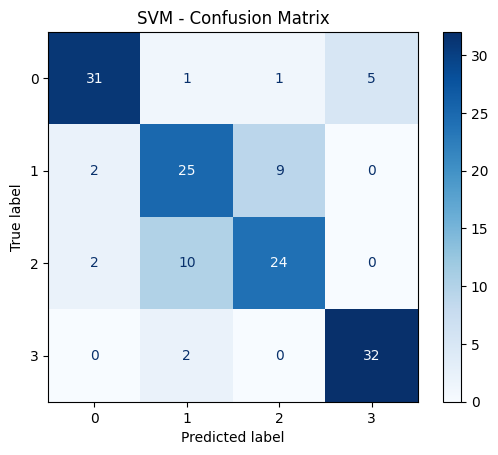


** XGBoost **
Accuracy: 0.7986111111111112
              precision    recall  f1-score   support

           0       0.91      0.76      0.83        38
           1       0.73      0.75      0.74        36
           2       0.77      0.75      0.76        36
           3       0.80      0.94      0.86        34

    accuracy                           0.80       144
   macro avg       0.80      0.80      0.80       144
weighted avg       0.80      0.80      0.80       144



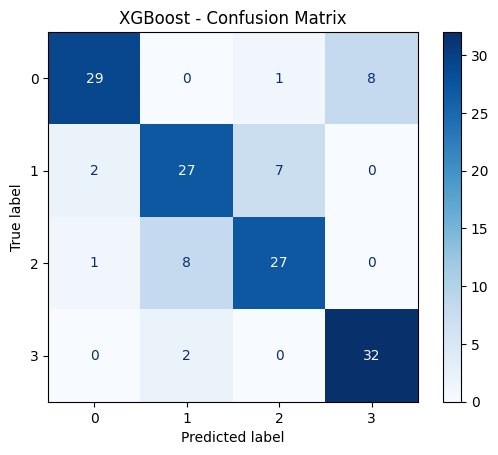

In [ ]:
# Get the best models from grid search
best_rf = rf_grid_search.best_estimator_
best_svm = svm_grid_search.best_estimator_
best_xgb = xgb_grid_search.best_estimator_

# Make predictions on the test set using the best Hyperparameter of each models
rf_preds = best_rf.predict(X_test)
svm_preds = best_svm.predict(X_test)
xgb_preds = best_xgb.predict(X_test)

# Evaluate each model
models = {
    "Random Forest": rf_preds,
    "SVM": svm_preds,
    "XGBoost": xgb_preds
}

for name, preds in models.items():
    print(f"\n** {name} **")
    print("Accuracy:", (preds == y_test).mean())

    # Classification Report
    print(classification_report(y_test, preds))

    # Confusion Matrix
    cm = confusion_matrix(y_test, preds, labels=Classes)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=Classes)
    disp.plot(cmap='Blues')
    plt.title(f"{name} - Confusion Matrix")
    plt.show()

In [ ]:
img_array = image.read()
print("Image array shape:", img_array.shape)  # Should be (#bands, height, width)

Image array shape: (13, 321, 757)


In [ ]:
img_reshaped = img_array.reshape(band_count, -1).T
print("Reshaped array for prediction:", img_reshaped.shape)


Reshaped array for prediction: (242997, 13)


In [ ]:
rf_prediction = best_rf.predict(img_reshaped)
svm_prediction = best_svm.predict(img_reshaped)
xgb_prediction = best_xgb.predict(img_reshaped)

print("Predictions made for all models on the image data.")

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


Predictions made for all models on the image data.


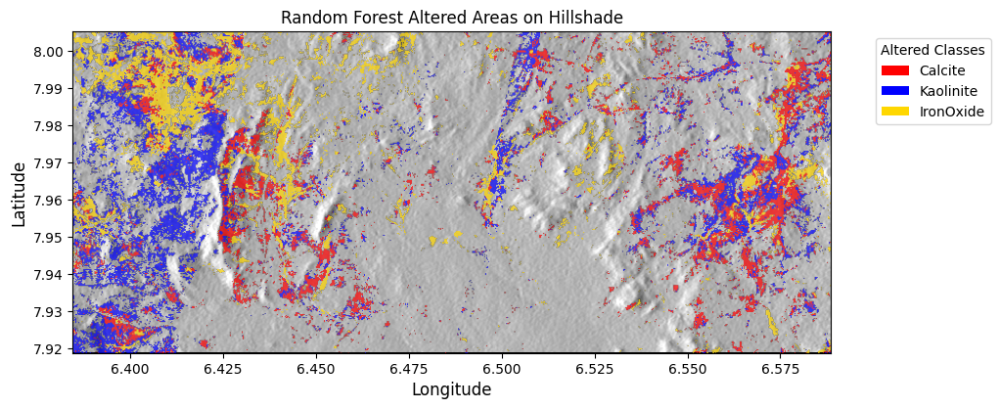

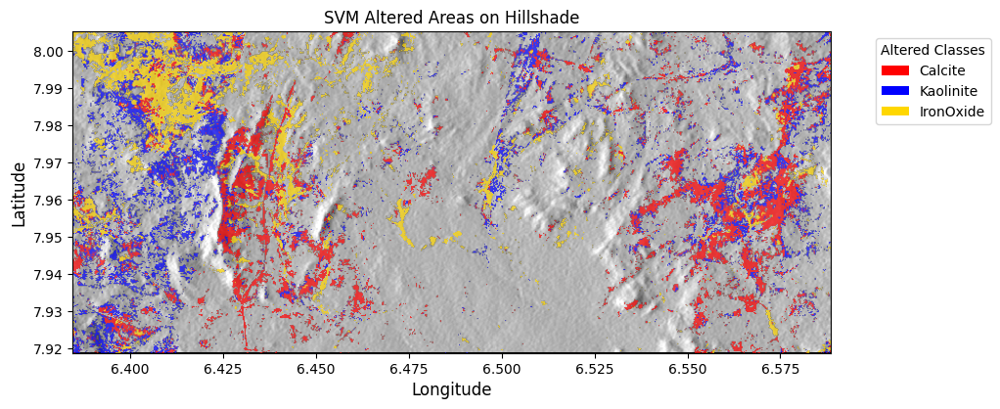

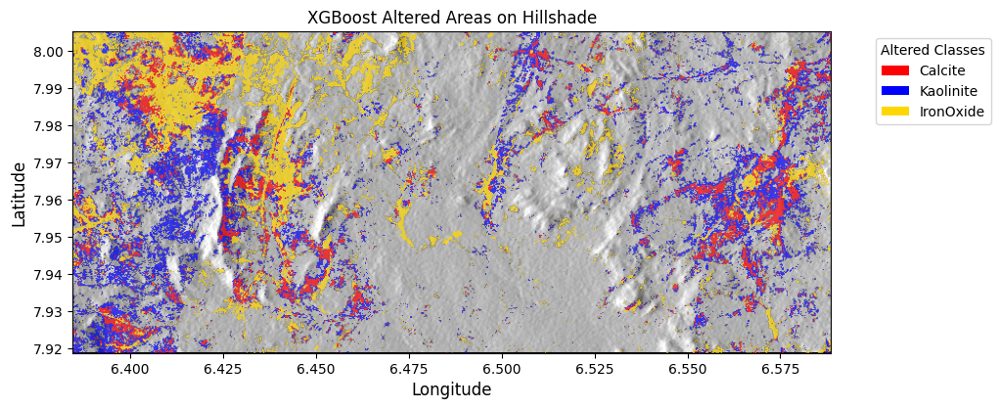

In [ ]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import from_levels_and_colors

Hillshade_Path = '/content/drive/MyDrive/GEE_Exports/Hillshade.tif'

try:
    with rasterio.open(Hillshade_Path) as hillshade_image:
        hillshade_array = hillshade_image.read(1) # Read the first band (assuming it's a single-band hillshade)
        hillshade_extent = [hillshade_image.bounds.left, hillshade_image.bounds.right,
                          hillshade_image.bounds.bottom, hillshade_image.bounds.top]
except rasterio.errors.RasterioIOError:
    print(f"Error: Could not open or read the hillshade image at {Hillshade_Path}")
    hillshade_array = None

if 'extent' not in locals():

    bbox = rasterio.coords.BoundingBox(
        left=transform.c,
        bottom=transform.f + transform.e * height,
        right=transform.c + transform.a * width,
        top=transform.f
    )
    extent = [bbox.left, bbox.right, bbox.bottom, bbox.top]

try:
    rf_prediction_map = rf_prediction.reshape(height, width).astype(np.uint8)
    svm_prediction_map = svm_prediction.reshape(height, width).astype(np.uint8)
    xgb_prediction_map = xgb_prediction.reshape(height, width).astype(np.uint8)
except NameError:
    print("Error: Prediction maps (rf_prediction, svm_prediction, xgb_prediction) are not defined.")
    print("Please ensure the previous cells generating these predictions have been run.")
    rf_prediction_map = None
    svm_prediction_map = None
    xgb_prediction_map = None


if hillshade_array is not None and rf_prediction_map is not None:
    remaining_classes = [c for c in Classes if c != 0]
    remaining_names = [Names[i] for i in remaining_classes]
    remaining_palette = [Palette[i] for i in remaining_classes]

    levels_remaining = remaining_classes + [max(remaining_classes) + 1]
    cmap_remaining, norm_remaining = from_levels_and_colors(levels_remaining, remaining_palette)

    mask_rf_no_alteration = (rf_prediction_map == 0)
    mask_svm_no_alteration = (svm_prediction_map == 0)
    mask_xgb_no_alteration = (xgb_prediction_map == 0)

    rf_altered_map = rf_prediction_map.astype(float) # Convert to float to allow NaN
    rf_altered_map[mask_rf_no_alteration] = np.nan

    svm_altered_map = svm_prediction_map.astype(float)
    svm_altered_map[mask_svm_no_alteration] = np.nan

    xgb_altered_map = xgb_prediction_map.astype(float)
    xgb_altered_map[mask_xgb_no_alteration] = np.nan

    fig, ax = plt.subplots(figsize=(10, 8))
    ax.imshow(hillshade_array, cmap='gray', extent=hillshade_extent, origin='upper')
    im = ax.imshow(rf_altered_map, cmap=cmap_remaining, norm=norm_remaining, extent=extent, origin='upper', alpha=0.7) # Overlay altered map with transparency
    ax.set_title("Random Forest Altered Areas on Hillshade", fontsize=12)
    ax.set_xlabel("Longitude", fontsize=12)
    ax.set_ylabel("Latitude", fontsize=12)

    legend_elements = [plt.matplotlib.patches.Patch(facecolor=remaining_palette[i],
                                                    label=remaining_names[i]) for i in range(len(remaining_classes))]
    ax.legend(handles=legend_elements, title="Altered Classes", loc='upper left', bbox_to_anchor=(1.05, 1))
    plt.show()

    fig, ax = plt.subplots(figsize=(10, 8))
    ax.imshow(hillshade_array, cmap='gray', extent=hillshade_extent, origin='upper')
    im = ax.imshow(svm_altered_map, cmap=cmap_remaining, norm=norm_remaining, extent=extent, origin='upper', alpha=0.7) # Overlay altered map with transparency
    ax.set_title("SVM Altered Areas on Hillshade", fontsize=12)
    ax.set_xlabel("Longitude", fontsize=12)
    ax.set_ylabel("Latitude", fontsize=12)

    legend_elements = [plt.matplotlib.patches.Patch(facecolor=remaining_palette[i],
                                                    label=remaining_names[i]) for i in range(len(remaining_classes))]
    ax.legend(handles=legend_elements, title="Altered Classes", loc='upper left', bbox_to_anchor=(1.05, 1))
    plt.show()

    # Visualize XGBoost altered map on hillshade
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.imshow(hillshade_array, cmap='gray', extent=hillshade_extent, origin='upper') # Plot hillshade first
    im = ax.imshow(xgb_altered_map, cmap=cmap_remaining, norm=norm_remaining, extent=extent, origin='upper', alpha=0.7) # Overlay altered map with transparency
    ax.set_title("XGBoost Altered Areas on Hillshade", fontsize=12)
    ax.set_xlabel("Longitude", fontsize=12)
    ax.set_ylabel("Latitude", fontsize=12)
    # Create a custom legend for the remaining classes
    legend_elements = [plt.matplotlib.patches.Patch(facecolor=remaining_palette[i],
                                                    label=remaining_names[i]) for i in range(len(remaining_classes))]
    ax.legend(handles=legend_elements, title="Altered Classes", loc='upper left', bbox_to_anchor=(1.05, 1))
    plt.show()

else:
    print("Cannot generate plots. Please check for errors in loading the hillshade or prediction maps.")


** Ensemble Model (Voting) **
Accuracy: 0.8125
               precision    recall  f1-score   support

No_Alteration       0.91      0.84      0.88        38
      Calcite       0.70      0.78      0.74        36
    Kaolinite       0.78      0.69      0.74        36
    IronOxide       0.86      0.94      0.90        34

     accuracy                           0.81       144
    macro avg       0.82      0.81      0.81       144
 weighted avg       0.82      0.81      0.81       144



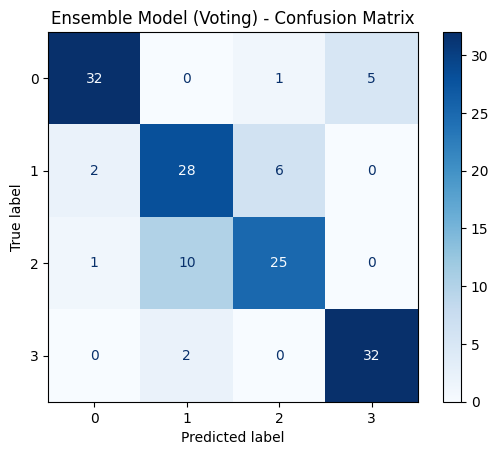

In [ ]:
from sklearn.ensemble import VotingClassifier

# Ensemble model using VotingClassifier
# The best trained models
ensemble_model = VotingClassifier(
    estimators=[
        ('rf', best_rf),
        ('svm', best_svm),
        ('xgb', best_xgb)
    ],
    voting='hard'
)

# Train the ensemble model
ensemble_model.fit(X_train, y_train)

# Make predictions with the ensemble model
ensemble_preds = ensemble_model.predict(X_test)

# Evaluate the ensemble model
print("\n** Ensemble Model (Voting) **")
print("Accuracy:", (ensemble_preds == y_test).mean())

# Classification Report
print(classification_report(y_test, ensemble_preds, target_names=Names))

# Confusion Matrix
cm = confusion_matrix(y_test, ensemble_preds, labels=Classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=Classes)
disp.plot(cmap='Blues')
plt.title("Ensemble Model (Voting) - Confusion Matrix")
plt.show()

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


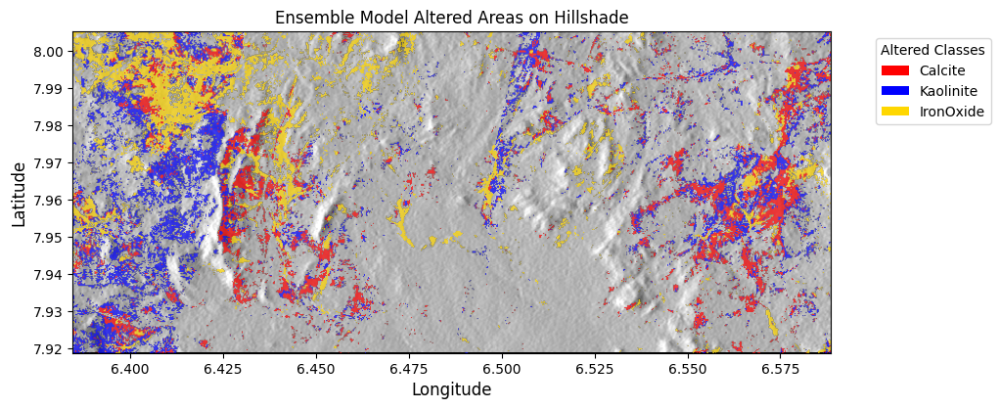

In [ ]:
# Make predictions on the entire image using the ensemble model
ensemble_prediction = ensemble_model.predict(img_reshaped)
ensemble_prediction_map = ensemble_prediction.reshape(height, width).astype(np.uint8)
left = transform.c
top = transform.f
right = transform.c + transform.a * width
bottom = transform.f + transform.e * height
extent = [left, right, bottom, top]

Hillshade_Path = '/content/drive/MyDrive/GEE_Exports/Hillshade.tif'
try:
    with rasterio.open(Hillshade_Path) as hillshade_image:
        hillshade_array = hillshade_image.read(1)
        hillshade_extent = [hillshade_image.bounds.left, hillshade_image.bounds.right,
                          hillshade_image.bounds.bottom, hillshade_image.bounds.top]
except rasterio.errors.RasterioIOError:
    print(f"Error: Could not open or read the hillshade image at {Hillshade_Path}")
    hillshade_array = None
    hillshade_extent = None


if hillshade_array is not None:
    mask_no_alteration = (ensemble_prediction_map == 0)
    ensemble_altered_map = ensemble_prediction_map.astype(float)
    ensemble_altered_map[mask_no_alteration] = np.nan

    remaining_classes = [c for c in Classes if c != 0]
    remaining_names = [Names[i] for i in remaining_classes]
    remaining_palette = [Palette[i] for i in remaining_classes]

    levels_remaining = remaining_classes + [max(remaining_classes) + 1]
    cmap_remaining, norm_remaining = from_levels_and_colors(levels_remaining, remaining_palette)

    fig, ax = plt.subplots(figsize=(10, 8))
    if hillshade_extent:
        ax.imshow(hillshade_array, cmap='gray', extent=hillshade_extent, origin='upper') # Plot hillshade
    else:
         ax.imshow(hillshade_array, cmap='gray', origin='upper') # Plot hillshade without extent if not available

    im = ax.imshow(ensemble_altered_map, cmap=cmap_remaining, norm=norm_remaining, extent=extent, origin='upper', alpha=0.7) # Overlay altered map

    ax.set_title("Ensemble Model Altered Areas on Hillshade", fontsize=12)
    ax.set_xlabel("Longitude", fontsize=12)
    ax.set_ylabel("Latitude", fontsize=12)

    legend_elements = [plt.matplotlib.patches.Patch(facecolor=remaining_palette[i],
                                                    label=remaining_names[i]) for i in range(len(remaining_classes))]
    ax.legend(handles=legend_elements, title="Altered Classes", loc='upper left', bbox_to_anchor=(1.05, 1))

    plt.show()

else:
    print("Cannot generate plot. Please check for errors in loading the hillshade image.")

/tmp/ipython-input-3523521033.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=rf_importance_df, palette='viridis')


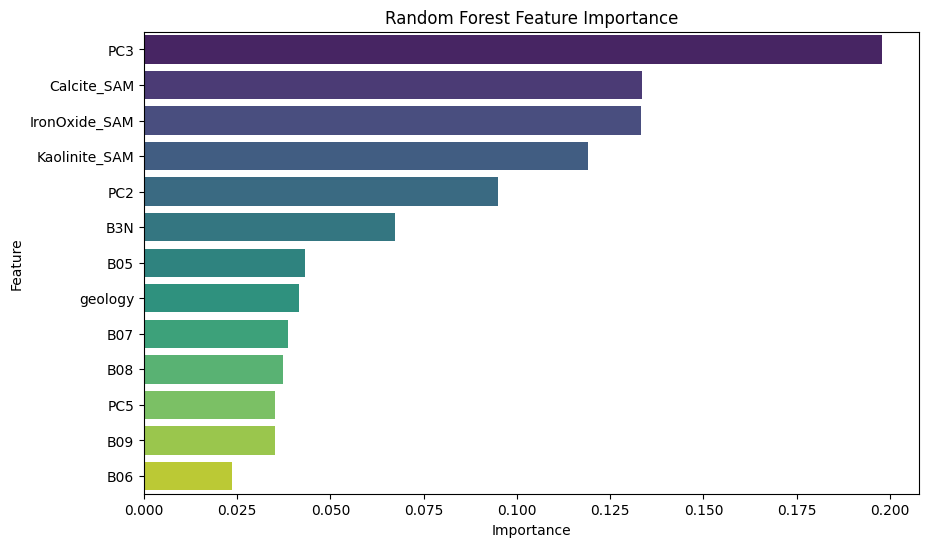

/tmp/ipython-input-3523521033.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=xgb_importance_df, palette='viridis')


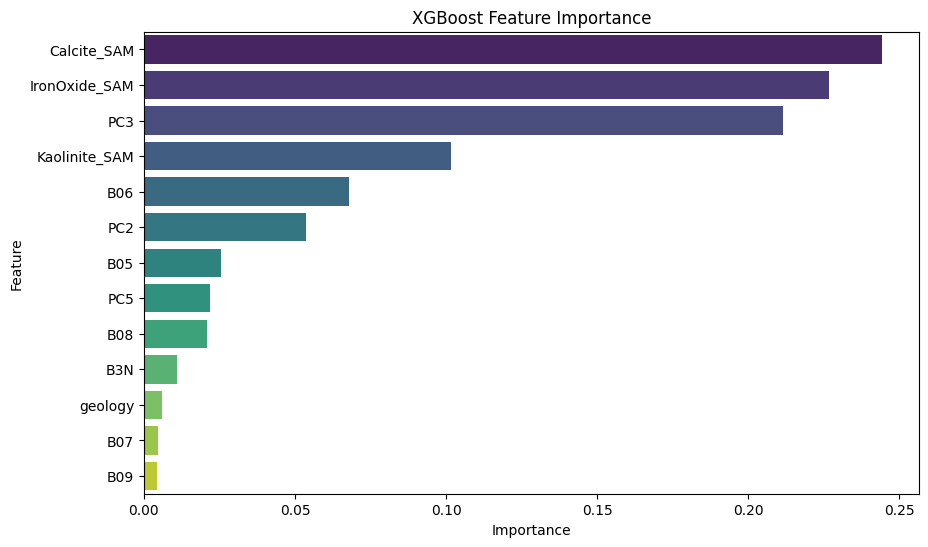

In [ ]:
# Get feature importances from Random Forest
rf_feature_importances = best_rf.feature_importances_
rf_importance_df = pd.DataFrame({
    'Feature': Bands,
    'Importance': rf_feature_importances
})
rf_importance_df = rf_importance_df.sort_values('Importance', ascending=False)

# Plot Random Forest Feature Importance
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=rf_importance_df, palette='viridis')
plt.title('Random Forest Feature Importance')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

# Get feature importances from XGBoost
xgb_feature_importances = best_xgb.feature_importances_

xgb_importance_df = pd.DataFrame({
    'Feature': Bands,
    'Importance': xgb_feature_importances
})
xgb_importance_df = xgb_importance_df.sort_values('Importance', ascending=False)

# Plot XGBoost Feature Importance
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=xgb_importance_df, palette='viridis')
plt.title('XGBoost Feature Importance')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

In [ ]:
!pip install rasterio scikit-learn matplotlib tensorflow
!pip install keras-tuner

In [ ]:
import keras_tuner as kt
from tensorflow import keras
from tensorflow.keras import layers
import pandas as pd
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.metrics import classification_report, roc_auc_score, roc_curve
import tensorflow as tf
from tensorflow.keras import layers, models, regularizers
import os


In [ ]:
Sample_Path = '/content/drive/MyDrive/GEE_Exports/Training_Samples_Fixed.csv'
Image_Path = '/content/drive/MyDrive/GEE_Exports/ImageG_Stacked_Float.tif'

# Define target and predictor variables
Bands = ['PC2', 'PC3', 'PC5', 'geology','B09', 'B08', 'B07', 'B05', 'B06', 'B3N',
  'Calcite_SAM', 'Kaolinite_SAM', 'IronOxide_SAM']
Classes = [0, 1, 2, 3]
N_Classes = 4
Names = ["No_Alteration", "Calcite", "Kaolinite", "IronOxide"]
Palette = [
    '#008000',  # Green  for class 0 (No_Alteration)
    '#FF0000',  # Red    for class 1 (Calcite)
    '#0000FF',  # Blue   for class 2 (Kaolinite)
    '#FFD700',  # Gold   for class 3 (IronOxide)
]
Target = 'class'
le = LabelEncoder()
df['label'] = le.fit_transform(df[Target])
num_unique_classes = df['label'].nunique()

scaler = MinMaxScaler()
X = scaler.fit_transform(df[Bands])
y = tf.keras.utils.to_categorical(df['label'], num_classes=num_unique_classes)

X = X.reshape(-1, 1, 1, len(Bands))

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
import keras_tuner as kt
from tensorflow import keras
from tensorflow.keras import layers

# Define the model building function for KerasTuner
def build_model(hp):
    model = keras.Sequential()
    model.add(layers.Conv2D(filters=hp.Int('filters', 32, 128, step=32),
                            kernel_size=(1, 1),
                            activation='relu',
                            input_shape=(1, 1, len(Bands))))
    model.add(layers.BatchNormalization())
    model.add(layers.Conv2D(filters=hp.Int('filters_2', 64, 256, step=64), # Add a second Conv2D layer
                            kernel_size=(1, 1),
                            activation='relu',
                            kernel_regularizer=regularizers.l2(hp.Float('l2_reg', 0.0001, 0.01, sampling='log')))) # Tune L2 regularization
    model.add(layers.BatchNormalization())
    model.add(layers.Flatten())
    model.add(layers.Dense(units=hp.Int('units', 32, 128, step=32), activation='relu'))
    model.add(layers.Dropout(rate=hp.Float('dropout', 0.2, 0.5, step=0.1)))
    model.add(layers.Dense(num_unique_classes, activation='softmax'))  # Use the determined number of unique classes

    model.compile(optimizer=keras.optimizers.Adam(learning_rate=hp.Choice('lr', [1e-3, 1e-4, 1e-5])), # Tune learning rate
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# Initialize tuner
tuner = kt.RandomSearch(build_model,
                        objective='val_accuracy',
                        max_trials=10,  # Reduced trials for faster execution
                        executions_per_trial=1,
                        directory='alteration_tuning_cnn',
                        project_name='cnn_hyperparam_search')

# Run search
print("Starting hyperparameter search...")
tuner.search(X_train, y_train, epochs=50, validation_split=0.2, verbose=1) # Increased epochs for better tuning

# Get the best model
best_model = tuner.get_best_models(num_models=1)[0]

print("\nEvaluating the best model on the test data...")
loss, accuracy = best_model.evaluate(X_test, y_test, verbose=0)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

y_pred = best_model.predict(X_test)

Reloading Tuner from alteration_tuning_cnn/cnn_hyperparam_search/tuner0.json
Starting hyperparameter search...


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 26 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



Evaluating the best model on the test data...
Test Loss: 0.4518
Test Accuracy: 0.8646
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step 


In [ ]:
def create_model():
    model = models.Sequential([
        layers.Conv2D(64, (1, 1), activation='relu', input_shape=(1, 1, len(Bands))),
        layers.BatchNormalization(),
        layers.Conv2D(128, (1, 1), activation='relu', kernel_regularizer=regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.Flatten(),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.4),
        layers.Dense(num_unique_classes, activation='softmax')  # Use the determined number of unique classes
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model = create_model()

# Train
history = model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=50,
    batch_size=16,
    verbose=1
)

Epoch 1/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.3605 - loss: 1.7582 - val_accuracy: 0.5455 - val_loss: 1.4242
Epoch 2/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6618 - loss: 0.8798 - val_accuracy: 0.2987 - val_loss: 1.3992
Epoch 3/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.7295 - loss: 0.7252 - val_accuracy: 0.2987 - val_loss: 1.3841
Epoch 4/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8044 - loss: 0.6554 - val_accuracy: 0.2857 - val_loss: 1.3682
Epoch 5/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.7941 - loss: 0.5578 - val_accuracy: 0.2987 - val_loss: 1.3428
Epoch 6/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.7627 - loss: 0.5749 - val_accuracy: 0.3896 - val_loss: 1.3013
Epoch 7/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8109 - loss: 0.4818 - val_accuracy: 0.5065 - val_loss: 1.2555
Epoch 8/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - accuracy: 0.7646 - loss: 0.5897 - val_accuracy: 0.5455 - v

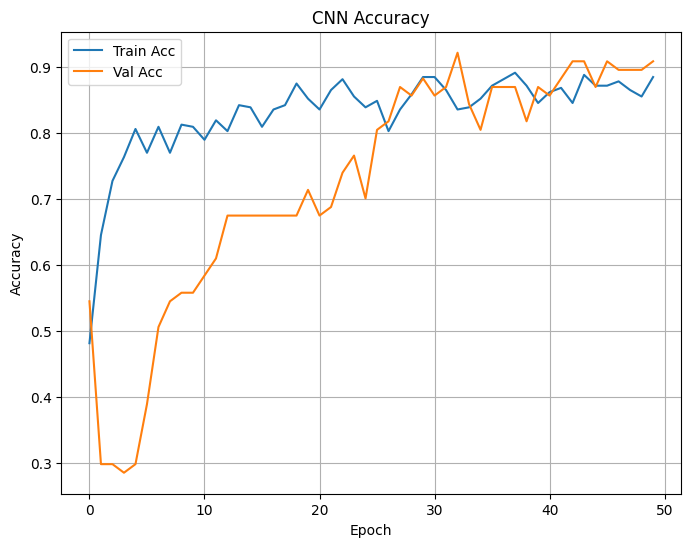

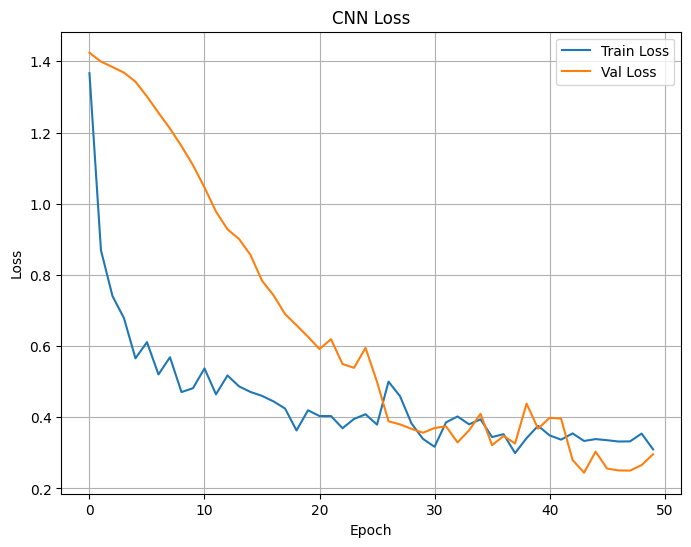

In [ ]:
# Accuracy plot
plt.figure(figsize=(8, 6))
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title('CNN Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# Loss plot
plt.figure(figsize=(8, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('CNN Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

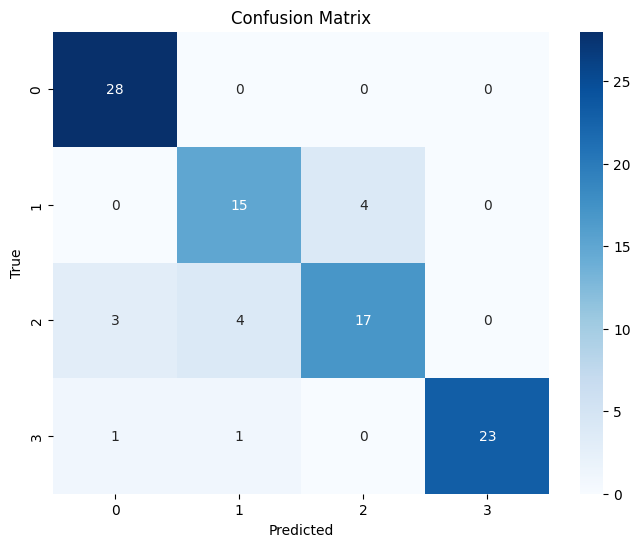

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

y_pred_labels = np.argmax(y_pred, axis=1)

# Confusion matrix
cm = confusion_matrix(np.argmax(y_test, axis=1), y_pred_labels)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=le.classes_,
            yticklabels=le.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

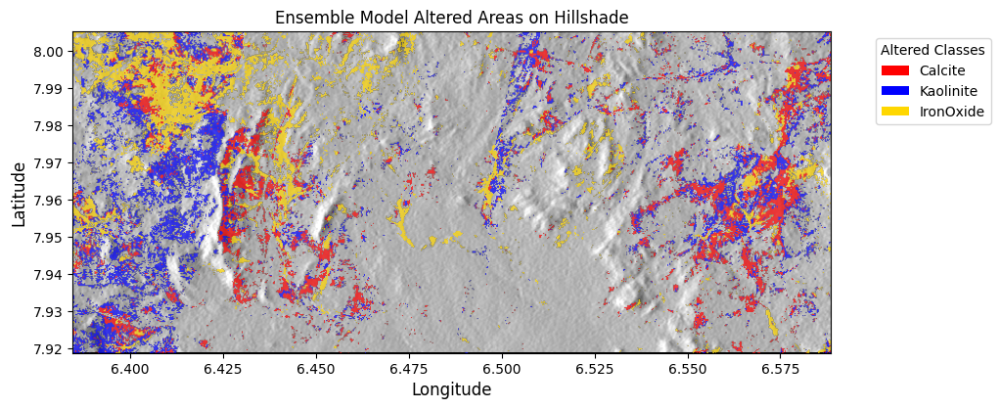

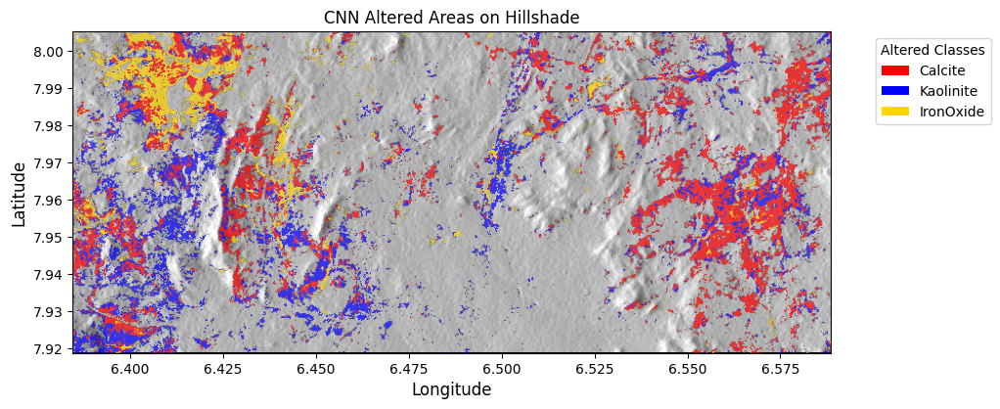

In [ ]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import from_levels_and_colors
from matplotlib.patches import Patch

# Define the path to the hillshade image
Hillshade_Path = '/content/drive/MyDrive/GEE_Exports/Hillshade.tif'

# Load the hillshade image
try:
    with rasterio.open(Hillshade_Path) as hillshade_image:
        hillshade_array = hillshade_image.read(1) # Read the first band (assuming it's a single-band hillshade)
        hillshade_extent = [hillshade_image.bounds.left, hillshade_image.bounds.right,
                          hillshade_image.bounds.bottom, hillshade_image.bounds.top]
except rasterio.errors.RasterioIOError:
    print(f"Error: Could not open or read the hillshade image at {Hillshade_Path}")
    hillshade_array = None


if 'extent' not in locals():
      try:
        bbox = rasterio.coords.BoundingBox(
            left=transform.c,
            bottom=transform.f + transform.e * height,
            right=transform.c + transform.a * width,
            top=transform.f
        )
        extent = [bbox.left, bbox.right, bbox.bottom, bbox.top]
      except NameError:
        print("Error: 'transform', 'height', or 'width' not defined. Cannot calculate extent.")
        extent = None

try:
    if 'ensemble_prediction' not in locals():
        print("Error: 'ensemble_prediction' is not defined. Please run the cell that generates ensemble predictions.")
        ensemble_prediction_map = None
    else:
        ensemble_prediction_map = ensemble_prediction.reshape(height, width).astype(np.uint8)

    if 'predicted_classes' not in locals():
        print("Error: 'predicted_classes' (CNN) is not defined. Please run the cell that generates CNN predictions.")
        cnn_prediction_map = None
    else:
        cnn_prediction_map = predicted_classes.reshape(height, width).astype(np.uint8)

except NameError:
    print("Error: 'height' or 'width' not defined. Cannot reshape prediction maps.")
    ensemble_prediction_map = None
    cnn_prediction_map = None


if hillshade_array is not None and extent is not None:
    remaining_classes = [c for c in Classes if c != 0]
    remaining_names = [Names[i] for i in remaining_classes]
    remaining_palette = [Palette[i] for i in remaining_classes]

    levels_remaining = remaining_classes + [max(remaining_classes) + 1]
    cmap_remaining, norm_remaining = from_levels_and_colors(levels_remaining, remaining_palette)

    if ensemble_prediction_map is not None:
        mask_ensemble_no_alteration = (ensemble_prediction_map == 0)
        ensemble_altered_map = ensemble_prediction_map.astype(float) # Convert to float to allow NaN
        ensemble_altered_map[mask_ensemble_no_alteration] = np.nan

        # Visualize Ensemble altered map on hillshade using the provided template
        fig, ax = plt.subplots(figsize=(10, 8))
        ax.imshow(hillshade_array, cmap='gray', extent=hillshade_extent, origin='upper') # Plot hillshade first
        im = ax.imshow(ensemble_altered_map, cmap=cmap_remaining, norm=norm_remaining, extent=extent, origin='upper', alpha=0.7) # Overlay altered map with transparency
        ax.set_title("Ensemble Model Altered Areas on Hillshade", fontsize=12)
        ax.set_xlabel("Longitude", fontsize=12)
        ax.set_ylabel("Latitude", fontsize=12)

        # Create a custom legend for the remaining classes
        legend_elements = [Patch(facecolor=remaining_palette[i],
                                                        label=remaining_names[i]) for i in range(len(remaining_classes))]
        ax.legend(handles=legend_elements, title="Altered Classes", loc='upper left', bbox_to_anchor=(1.05, 1))

        plt.show()

    if cnn_prediction_map is not None:
         # Create mask for the 'No_Alteration' class (class 0) for CNN
        mask_cnn_no_alteration = (cnn_prediction_map == 0)

        # Apply mask to keep only the altered classes, setting masked values to NaN
        cnn_altered_map = cnn_prediction_map.astype(float) # Convert to float to allow NaN
        cnn_altered_map[mask_cnn_no_alteration] = np.nan

        # Visualize CNN altered map on hillshade using the provided template
        fig, ax = plt.subplots(figsize=(10, 8))
        ax.imshow(hillshade_array, cmap='gray', extent=hillshade_extent, origin='upper') # Plot hillshade first
        im = ax.imshow(cnn_altered_map, cmap=cmap_remaining, norm=norm_remaining, extent=extent, origin='upper', alpha=0.7) # Overlay altered map with transparency
        ax.set_title("CNN Altered Areas on Hillshade", fontsize=12)
        ax.set_xlabel("Longitude", fontsize=12)
        ax.set_ylabel("Latitude", fontsize=12)

        # Create a custom legend for the remaining classes
        legend_elements = [Patch(facecolor=remaining_palette[i],
                                                        label=remaining_names[i]) for i in range(len(remaining_classes))]
        ax.legend(handles=legend_elements, title="Altered Classes", loc='upper left', bbox_to_anchor=(1.05, 1))

        plt.show()


elif hillshade_array is None:
    print("Cannot generate plots because the hillshade image could not be loaded.")
else:
     print("Cannot generate plots because prediction maps or extent could not be determined.")